# Проектная работа - Рынок заведений общественного питания Москвы

Цель: исследовать рынок с заведениями общественного питания Москвы и выявить его особенности в целях открытия бизнес-точки.

***План работ:***

**Шаг 1. Загрузка данных и изучение общей информации**\
Путь к файлу: /datasets/moscow_places.csv. Скачать датасет

**Шаг 2. Предобработка данных**
- Проверить пропуски и дубликаты;
- Создать столбец 'street' с названиями улиц из столбца с адресом;
- Создать столбец 'is_24_7' с обозначением, что заведение работает ежедневно и круглосуточно (24/7): 
    - логическое значение True — если заведение работает ежедневно и круглосуточно;
    - логическое значение False — в противоположном случае.

**Шаг 3. Анализ данных**
- Какие категории заведений представлены в данных? Исследовать количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построить визуализации. Ответить на вопрос о распределении заведений по категориям;
- Исследовать количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построить визуализации. Проанализировать результаты и сделать выводы;
- Рассмотреть и изобразить соотношение сетевых и несетевых заведений в датасете. Каких заведений больше;
- Какие категории заведений чаще являются сетевыми? Исследовать данные и ответить на вопрос графиком;
- Сгруппировать данные по названиям заведений и найти топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построить подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся;
- Какие административные районы Москвы присутствуют в датасете? Отобразить общее количество заведений и количество заведений каждой категории по районам. Попробовать проиллюстрировать эту информацию одним графиком;
- Визуализировать распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита;
- Построить фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы);
- Отобразить все заведения датасета на карте с помощью кластеров средствами библиотеки folium;
- Найти топ-15 улиц по количеству заведений. Построить график распределения количества заведений и их категорий по этим улицам. Попробовать проиллюстрировать эту информацию одним графиком;
- Найти улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях;
- Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитать медиану этого столбца для каждого района. Использовать это значение в качестве ценового индикатора района. Построить фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализировать цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях;
- Необязательное задание: проиллюстрировать другие взаимосвязи, которые вы нашли в данных. Например, по желанию исследовать часы работы заведений и их зависимость от расположения и категории заведения. Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений;
- Собрать наблюдения по вопросам выше в один общий вывод.

**Шаг 4. Детализируем исследование: открытие кофейни**\
Заказчики хотят открыть крутую и доступную кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов. \
Ответить на следующие вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
-  Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Построить визуализации. Попробовать дать рекомендацию для открытия нового заведения. Это творческое задание: здесь нет правильного или неправильного ответа, но ваше решение должно быть чем-то обосновано. Объяснить свою рекомендацию можно текстом с описанием или маркерами на географической карте.

**Шаг 5. Подготовка презентации**\
Подготовить презентацию исследования для инвесторов.


## Шаг 1. Загрузка данных и изучение общей информации

In [1]:
import pandas as pd
import matplotlib.pyplot as plt 
import scipy.stats as stats
from scipy import stats as st
import math as mth
import numpy as np
from datetime import datetime, timedelta
import datetime as dt
import seaborn as sns
import plotly.express as px 
from plotly import graph_objects as go
import json # подключаем модуль для работы с JSON-форматом
from folium import Map, Choropleth # импортируем карту и хороплет
from folium import Marker, Map # подключаем библиотеку для работы с кластерами
from folium.plugins import MarkerCluster # импортируем кластер

In [2]:
# отображение всех колонок при выводе на печать
pd.set_option('display.max_columns', None)

In [3]:
data = pd.read_csv('/datasets/moscow_places.csv')# прочла csv-файл
data.info()
display(data.head(10))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


Отмечаем большое кол-во пропусков.

In [4]:
print(data['name'].unique())# уникальные заведений
data['name'].nunique()# кол-во уникальных заведений

['WoWфли' 'Четыре комнаты' 'Хазри' ... 'Миславнес' 'Самовар' 'Kebab Time']


5614

In [5]:
data['name'] = data['name'].str.lower()# названия заведений привели к нижнему регистру 
data['name'].nunique()# кол-во уникальных заведений

5512

Привели к нижнему регистру названия заведений, засчет чего число уникальных заведений стало маньше. 

In [6]:
print(data['category'].unique())# уникальные категории заведений
data['category'].nunique()# кол-во категорий заведений

['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


8

***Вывод:***

Датасет составлен на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года и содержит информацию о 8406 заведениях, из которых 5512 уникальных заведений. Число категорий заведений - 8. Необходимо изменить тип данных в столбах 'middle_avg_bill', 'middle_coffee_cup' и 'seats' на целочисленный и 'chain' на логический. Все остальные типы данных указаны корректно. Отмечаем большое количество пропусков, которые рассмотрим далее подробнее.

## Шаг 2. Предобработка данных

In [7]:
display(data.isna().sum()) # количество пропущенных значений для каждого столбца 

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [8]:
pass_data=(data.isnull().sum()/ len(data))*100 # процент пропусков в столбцах
pass_data.round(0)

name                  0.0
category              0.0
address               0.0
district              0.0
hours                 6.0
lat                   0.0
lng                   0.0
rating                0.0
price                61.0
avg_bill             55.0
middle_avg_bill      63.0
middle_coffee_cup    94.0
chain                 0.0
seats                43.0
dtype: float64

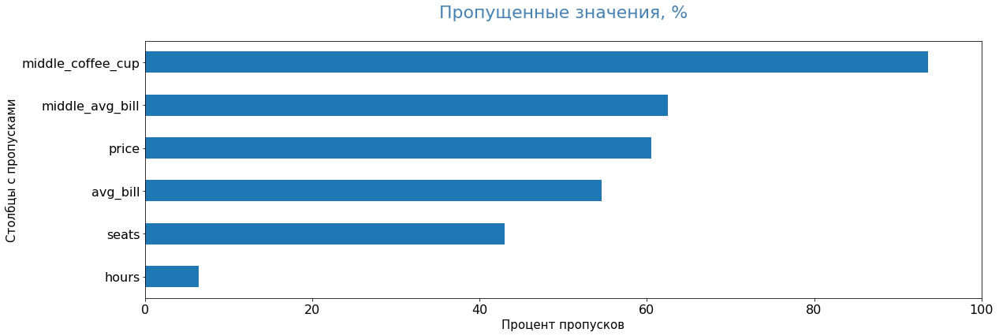

In [9]:
def pass_value_barh(data):
    try:
        (
            (data.isna().mean()*100)
            .to_frame()
            .rename(columns = {0:'space'})
            .query('space > 0')
            .sort_values(by = 'space', ascending = True)
            .plot(kind = 'barh', figsize = (19,6), rot = 0, legend = False, fontsize = 16)
                        
        ); 
        plt.title('Пропущенные значения, %' + "\n", fontsize=22, color='SteelBlue')
        plt.xlabel('Процент пропусков', fontsize=15)
        plt.ylabel('Столбцы с пропусками', fontsize=15)  
        plt.xlim(0, 100) 
    except:
        print('пропусков не осталось :) или произошла ошибка в первой части функции ')
pass_value_barh(data)

Меньше всего информации о числе цены за одну чашку капучино - 94% пропусков. Мало информации о числе среднего счете, средней стоимость заказа, категории цен в заведении и количестве посадочных мест. 43% пропусков о часах работы заведения.

In [10]:
missing_values = data.isnull().sum() #кол-во пропущенных значений в столбцах
total_missing = missing_values.sum() #кол-во пропущенных значений во всем датасете 
total_cells = data.size #кол-во ячеек во всем датасете 
missing_ratio = (total_missing/total_cells)*100 
print('Процент пропусков во всем датасете', missing_ratio.round(0))

Процент пропусков во всем датасете 23.0


In [11]:
data.duplicated().sum()# число явных дубликатов 

0

In [12]:
data[data.duplicated(subset=['name', 'address'], keep=False)]# частичные дубликаты 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Нашли 3 пары частичных дубликатов по одинаковым названиям и адресам. 

In [13]:
data.drop_duplicates(subset=['name', 'address'], keep='first', inplace=True)# сохранили только первые строки дублей 

In [14]:
data['dubli'] = data['name'].str.split(' ').str[0]# частичные дубликаты 
data[data.duplicated(subset=['dubli', 'category', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,dubli
20,чебуреки манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880287,37.448646,4.3,NaN,NaN,NaN,NaN,1,148.0,чебуреки
55,чебуреки и манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880288,37.448645,4.3,NaN,NaN,NaN,NaN,0,148.0,чебуреки
416,чайхана халал,ресторан,"Москва, Смольная улица, 24Г, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.860894,37.482553,4.3,NaN,NaN,NaN,NaN,0,53.0,чайхана
450,чайхана халаль,ресторан,"Москва, Смольная улица, 24Г, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.860892,37.482538,4.3,NaN,NaN,NaN,NaN,1,53.0,чайхана
1642,кафе для поминок,кафе,"Москва, улица Верхняя Масловка, 10, стр. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.793295,37.565569,4.9,NaN,NaN,NaN,NaN,0,50.0,кафе
1671,кафе замок,кафе,"Москва, улица Верхняя Масловка, 10, стр. 4",Северный административный округ,"ежедневно, 10:00–00:00",55.793331,37.565588,4.2,средние,Средний счёт:700–1000 ₽,850.0,NaN,0,50.0,кафе
2384,хлеб насущный,булочная,"Москва, Комсомольская площадь, 3",Центральный административный округ,"ежедневно, круглосуточно",55.776529,37.655238,4.1,NaN,NaN,NaN,NaN,1,200.0,хлеб
2467,хлеб насущный экспресс,булочная,"Москва, Комсомольская площадь, 3",Центральный административный округ,пн-пт 07:00–21:00; сб 07:00–20:00; вс 08:00–20:00,55.779720,37.654411,4.1,NaN,NaN,NaN,NaN,0,200.0,хлеб
2719,dragon bubble tea,кафе,"Москва, Щёлковское шоссе, вл75",Восточный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.810949,37.799413,4.0,NaN,NaN,NaN,NaN,0,NaN,dragon
2833,царская кофейня,кофейня,"Москва, Измайловское шоссе, 73Ж",Восточный административный округ,"сб,вс 10:00–20:00",55.794209,37.749043,4.0,NaN,NaN,NaN,NaN,0,NaN,царская


Отмечаем дубликаты по категории, адресу и похожим названиям.

In [15]:
data.drop([20,416,2467,2866,2833,2941,3376,5850,6843,7326,7404,7743,7900,8017,1642], inplace=True)#удалили дубликаты по индексу 

In [16]:
data = data.drop(['dubli'], axis=1) #удалили столбец

Столбцы 'hours', 'price', 'avg_bill' имеют тип данных object, поэтому заполним пропуски условным значением - 'нет данных'.

In [17]:
#заменены все пропуски в столбцах типа object 'hours', 'price', 'avg_bill' 
for column in ['hours', 'price', 'avg_bill']:
    data[column] = data[column].fillna('нет данных')

Так как пропуски в столбцах 'middle_avg_bill' и 'middle_coffee_cup' напрямую зависят от столбца 'avg_bill', то сверим число пропусков в этих столбах с числом определенных записей в 'avg_bill'.
Отсутствие пропусков в 'middle_avg_bill' по записям "Средний счёт" в 'avg_bill'. Следовательно, пропуски в 'middle_avg_bill' можно заполнить заглушками - 0 и изменить тип данных на int, так как все цены указаны цельно. А пропуски в столбце 'seats' заменяем на условное значение - 2000 и меняем тип данных на int, так как число посадочных мест не может быть дробным.

In [18]:
ss=data.query('avg_bill=="Средний счёт"')# поиск строк с записью "Средний счёт"
ss['middle_avg_bill'].isna().sum()

0

In [19]:
#аналогично по столбцу middle_coffee_cup 
pc=data.query('avg_bill=="Цена одной чашки капучино"')# поиск строк с записью "Цена одной чашки капучино"
pc['middle_coffee_cup'].isna().sum()

0

In [20]:
#заменены все пропуски в столбцах 'middle_avg_bill' и 'middle_coffee_cup' на 0 и изменен тип данных на int
data['middle_avg_bill'] = data['middle_avg_bill'].fillna(0).astype('int')
data['middle_coffee_cup'] = data['middle_coffee_cup'].fillna(0).astype('int') 

In [21]:
data['chain'] = data['chain'].astype('bool') #изменен тип данных на логический

In [22]:
#заменены все пропуски в столбце'seats' на условное значение заглушку - 2000 и изменен тип данных на int
data['seats'] = data['seats'].fillna(2000).astype('int')
data['seats'].sort_values().unique()# число посадочных мест в заведениях

array([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,   10,
         12,   13,   14,   15,   16,   17,   18,   19,   20,   21,   22,
         24,   25,   26,   27,   28,   29,   30,   32,   33,   34,   35,
         36,   37,   38,   39,   40,   41,   42,   43,   44,   45,   46,
         47,   48,   49,   50,   51,   52,   53,   54,   55,   56,   58,
         60,   61,   62,   63,   64,   65,   66,   67,   68,   69,   70,
         72,   74,   75,   76,   77,   78,   79,   80,   81,   82,   83,
         84,   85,   86,   87,   88,   90,   92,   93,   94,   95,   96,
         97,   98,   99,  100,  102,  104,  105,  106,  107,  108,  110,
        112,  113,  114,  115,  116,  118,  120,  122,  124,  125,  126,
        127,  128,  130,  131,  132,  133,  135,  138,  140,  141,  143,
        144,  145,  146,  147,  148,  150,  151,  154,  155,  157,  158,
        159,  160,  161,  164,  165,  166,  167,  168,  170,  173,  174,
        175,  176,  178,  180,  184,  185,  187,  1

In [23]:
#проверка
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8388 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8388 non-null   object 
 1   category           8388 non-null   object 
 2   address            8388 non-null   object 
 3   district           8388 non-null   object 
 4   hours              8388 non-null   object 
 5   lat                8388 non-null   float64
 6   lng                8388 non-null   float64
 7   rating             8388 non-null   float64
 8   price              8388 non-null   object 
 9   avg_bill           8388 non-null   object 
 10  middle_avg_bill    8388 non-null   int64  
 11  middle_coffee_cup  8388 non-null   int64  
 12  chain              8388 non-null   bool   
 13  seats              8388 non-null   int64  
dtypes: bool(1), float64(3), int64(3), object(7)
memory usage: 925.6+ KB


Создаем столбец 'street' с названиями улиц из столбца с адресом:

In [24]:
def street(row):
    address = row['address'].split(', ')
    street = address[1]
    return street
data['street'] = data.apply(street, axis=1)
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,нет данных,нет данных,0,0,False,2000,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,0,False,4,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,0,False,45,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,нет данных,Цена чашки капучино:155–185 ₽,0,170,False,2000,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500,0,True,148,Правобережная улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,нет данных,нет данных,0,0,False,86,Профсоюзная улица
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,нет данных,нет данных,0,0,False,150,Пролетарский проспект
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,нет данных,Средний счёт:от 150 ₽,150,0,False,150,Люблинская улица
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,нет данных,нет данных,0,0,True,150,Люблинская улица


Создаем столбец 'is_24_7' с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

In [25]:
def operating_mode(row):
    if 'ежедневно, круглосуточно' in row:
        return 'True'
    return 'False'
data['is_24_7'] = data['hours'].apply(operating_mode)
data.head(30)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,нет данных,нет данных,0,0,False,2000,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,0,False,4,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,0,False,45,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,нет данных,Цена чашки капучино:155–185 ₽,0,170,False,2000,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500,0,True,148,Правобережная улица,False
5,sergio pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,нет данных,0,0,False,2000,Ижорская улица,False
6,огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199,0,False,45,Клязьминская улица,False
7,mr. уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250,0,False,45,Клязьминская улица,False
8,donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500,0,False,79,Дмитровское шоссе,False
9,готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100,0,False,65,Ангарская улица,False


***Вывод:***

Имеем пропуски в 6 столбцах: 'hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup' и 'seats', которые совместно составляют 23% во всем датасете. Пропуски были заполнены значениями заглушками, так как эти данные получить или рассчитать нельзя. Явные дубликаты отсутствуют, однако были удалены неявные дубликаты. Добавлен столбец 'street' с названиями улиц и столбец 'is_24_7', обозначающий ежедневный и круглосуточный режим работы заведения. Поменяли тип данных столбцов: 'chain' на логический тип, 'middle_avg_bill', 'middle_coffee_cup' и 'seats' на целочисленный.

## Шаг 3. Анализ данных

### Какие категории заведений представлены в данных? Исследовать количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построить визуализации. Ответить на вопрос о распределении заведений по категориям;

In [26]:
category_count = data.groupby('category').agg({'name':'count'}).sort_values(by='name', ascending=False).reset_index()
category_count.columns = ['category', 'count']
category_count

,category,count
0,кафе,2370
1,ресторан,2040
2,кофейня,1411
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,600
6,столовая,315
7,булочная,255


In [27]:
category_count['rate'] = round(category_count['count']/sum(category_count['count'])*100, 1)
category_count

,category,count,rate
0,кафе,2370,28.3
1,ресторан,2040,24.3
2,кофейня,1411,16.8
3,"бар,паб",764,9.1
4,пиццерия,633,7.5
5,быстрое питание,600,7.2
6,столовая,315,3.8
7,булочная,255,3.0


In [28]:
fig = px.bar(category_count, x='category', y='count', text='rate', template='plotly_white',\
             title='Распределение заведений по категориям')
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Категории заведений',
                  yaxis_title='Количество заведений')
fig.show() 

***Итого:***

Представлено 8 видов категорий. Самые часто встречаемые заведения категорий: кафе, ресторан, кофейня, которые совместно занимают почти 70% рынка общественного питания. Меньше всего заведений категории булочная, занимают 3% от всего рынка. 

### Исследовать количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построить визуализации. Проанализировать результаты и сделать выводы;

In [29]:
good_data = data.query('seats != 2000')# очищенный датасет

In [30]:
good_data['seats'].describe().round(1)# описательная статистика столбца 'seats'

count    4782.0
mean      108.4
std       122.9
min         0.0
25%        40.0
50%        75.0
75%       140.0
max      1288.0
Name: seats, dtype: float64

Медиана от среднего отличается, т.е. есть выбросы. Посмотрим на диаграммы размаха числа посадочных мест по категориям.

In [31]:
#добавлии столбец с медианным значением посадочных мест для каждой категории и отсортировали 
good_data['median_seats'] = good_data.groupby('category')['seats'].transform('median')
good_data=good_data.sort_values(by='median_seats', ascending=False)

/tmp/ipykernel_173/4015354128.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



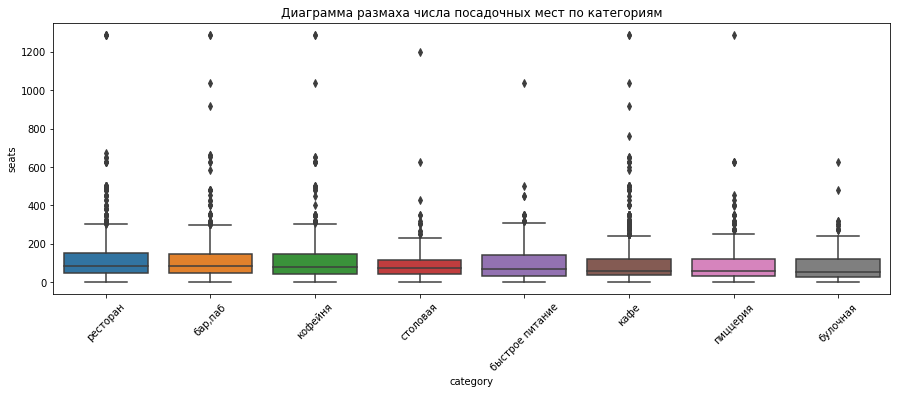

In [32]:
#боксплоты распределений кол-ва посадочных мест по категориям 
fig, ax = plt.subplots(figsize = (15,5))
ax=sns.boxplot(x='category', y='seats', data=good_data)
ax.set_title('Диаграмма размаха числа посадочных мест по категориям')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45);

Выбросы начинаются с 250-300 мест.

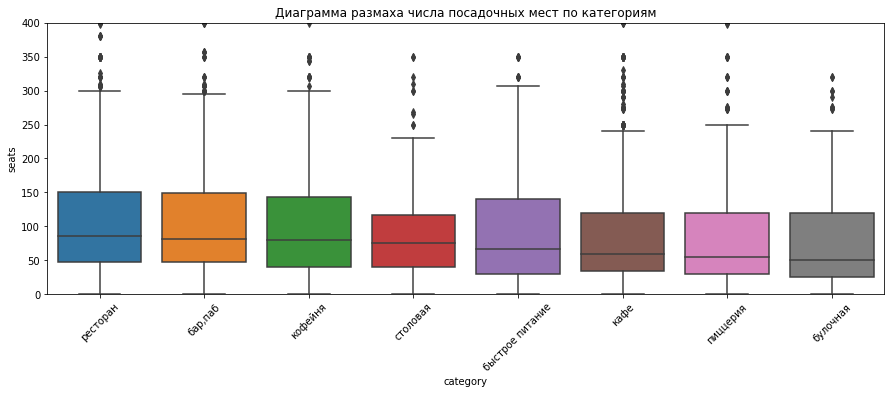

In [33]:
fig, ax = plt.subplots(figsize = (15,5))
ax=sns.boxplot(x='category', y='seats', data=good_data)
ax.set_title('Диаграмма размаха числа посадочных мест по категориям')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
ax.set_ylim(0, 400);

Заведения разных категорий имеют схожее кол-во посадочных мест: МКР - от 40 до 150 посадочных мест, медианные значения от 60 до 80 мест. Огромное количество выбросов, начиная с 240-300 мест. Больше всего пасадочных мест (большой МРК) у категорий: ресторан, бар, кофейня. 

In [34]:
category_seats = good_data.groupby('category').agg({'seats':'median'}).sort_values(by='seats', ascending=False).reset_index()
category_seats.columns = ['category', 'seats_count']
category_seats

,category,seats_count
0,ресторан,86.0
1,"бар,паб",82.0
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,67.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


In [35]:
# распределение кол-ва посадочных мест по категориям 
fig = px.bar(category_seats, x='category', y='seats_count', text='seats_count', template='plotly_white',\
             title='Количество посадочных мест по категориям')
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Категории заведений',
                  yaxis_title='Медианное кол-во посадочных мест')
fig.show() 

***Итого:***

Заведения разных категорий имеют кол-во посадочных мест - в среднем от 60 до 80. Аномальное число посадочных мест для кафе, пиццерий, булочных и столовых начинается с 240 мест, а для ресторанов, баров, кафеен и заведений быстрого питания аномалии начинаются от 300 мест. Больше всего пасадочных мест встречается у категорий: ресторан, бар/паб и кофейня - в среднем от 80 мест, а меньше всего у булочных - в среднем 50 мест.

### Рассмотреть и изобразить соотношение сетевых и несетевых заведений в датасете. Каких заведений больше;

In [36]:
chain_count = ['несетевые', 'сетевые']
values = [len(data.query('chain == 0')), len(data.query('chain == 1'))]
fig = go.Figure(data=[go.Pie(labels=chain_count, values=values)])
fig.update_layout(title='Cоотношение сетевых и несетевых заведений', 
                  width=800, 
                  height=400,
                  annotations=[dict(x=1.15, 
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show() 

***Итого:***

Почти 62% заведений в Москве несетевые, а сетевых только 38%.

### Какие категории заведений чаще являются сетевыми? Исследовать данные и ответить на вопрос графиком;

In [37]:
category_chain = data.groupby('category').agg({'chain': 'sum', 'name':'count'}).reset_index()
category_chain.columns = ['category', 'chain_count', 'name_count']
#доли сетевых по категориям из сетевых заведений 
category_chain['rate_network'] = round(category_chain['chain_count']/sum(category_chain['chain_count'])*100, 1)
#доли сетевых по категориям от всего объема заведений
category_chain['rate_network_total'] = round(category_chain['chain_count']/category_chain['name_count']*100, 1)
display(category_chain.sort_values('rate_network_total', ascending=False))

,category,chain_count,name_count,rate_network,rate_network_total
1,булочная,157,255,4.9,61.6
5,пиццерия,330,633,10.3,52.1
4,кофейня,720,1411,22.5,51.0
2,быстрое питание,231,600,7.2,38.5
6,ресторан,729,2040,22.8,35.7
3,кафе,777,2370,24.3,32.8
7,столовая,88,315,2.8,27.9
0,"бар,паб",168,764,5.2,22.0


In [38]:
# доля сетевых заведений по категориям  
category_chain = category_chain.sort_values('rate_network_total', ascending=False)
fig = px.bar(category_chain, x='category', y='rate_network_total', text='rate_network_total', template='plotly_white',\
             title='Доля сетевых заведений по категориям  ')
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Категории заведений',
                  yaxis_title='Доля сетевых заведений, %')
fig.show() 

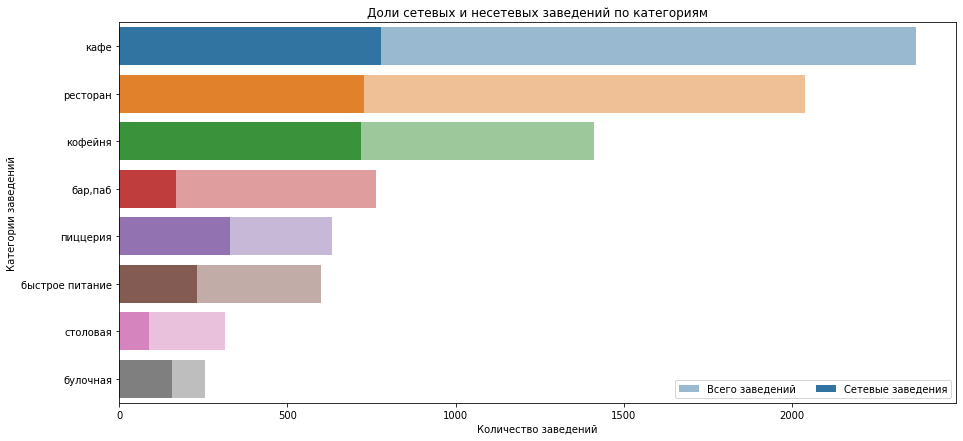

In [39]:
fig, ax = plt.subplots(figsize=(15, 7))
category_chain = category_chain.sort_values('name_count', ascending=False)
sns.barplot(x='name_count', y='category', data=category_chain, label='Всего заведений', alpha=0.5,  orient='h')
sns.barplot(x='chain_count', y='category', data=category_chain, label='Сетевые заведения')
ax.legend(ncol=2, loc='lower right')
ax.set(ylabel="Категории заведений", xlabel="Количество заведений")
plt.title('Доли сетевых и несетевых заведений по категориям')
plt.show()

***Итого:***

Среди сетевых заведений (38% всего рынка) чаще всего предподчтительнее заведения категорий булочные, пиццерии и кофейни.
В категориях бар/паб и столовая сильнее преобладают несетевые заведения. У всех наиболее распространенные категории это кафе и рестораны.

### Сгруппировать данные по названиям заведений и найти топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построить подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся;

In [40]:
category_network=data.query('chain == 1') # датасет только с сетевыми заведениями 

In [41]:
print('Всего уникальных сетевых заведений в Москве:', category_network['name'].nunique())

Всего уникальных сетевых заведений в Москве: 746


In [42]:
top_names= category_network['name'].value_counts().reset_index().head(15)# топ-15 сетей по количеству заведений
top_names.columns = ['name', 'count']
top_names

,name,count
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


In [43]:
#воронка топ-15 сетевых заведений
fig = go.Figure([go.Funnel(x=top_names['count'], y=top_names['name'])])
fig.update_layout(title='Топ-15 сетевых заведений')          
fig.show()

Сеть кафеен "Шоколадница" - рекордсмен по кол-ву сетевых заведений. Кафе "му-му" занимает последнее место по числу заведений сети.

In [44]:
#кол-во сетевых заведений по категориям 
name_count = category_network.groupby(['name', 'category'])['district'].count().reset_index()
name_count.columns = ['name', 'category', 'count']
name_count.sort_values('count', ascending=False)

,name,category,count
1125,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
205,one price coffee,кофейня,71
1141,яндекс лавка,ресторан,69
...,...,...,...
520,жан-жак,"бар,паб",1
521,жан-жак,кафе,1
522,жан-жак,ресторан,1
528,зарафшон,"бар,паб",1


In [45]:
#распределение по категориям уникальных сетевых заведений (1148 строк)
top_network_category = category_network.groupby('category').agg({'name':'nunique'})\
    .sort_values(by='name', ascending=False).reset_index()
top_network_category['rate'] = round(top_network_category['name']/sum(top_network_category['name'])*100, 1)
top_network_category

,category,name,rate
0,кафе,354,30.8
1,ресторан,274,23.9
2,кофейня,157,13.7
3,быстрое питание,117,10.2
4,"бар,паб",88,7.7
5,пиццерия,64,5.6
6,столовая,53,4.6
7,булочная,41,3.6


In [46]:
fig = px.bar(top_network_category, x='category', y='name', text='rate', template='plotly_white')
fig.update_layout(title='Распределение уникальных сетей по категориям',
                  xaxis_title='Категории заведений',
                  yaxis_title='Количество заведений')
fig.show()

In [47]:
# распределение топ-15 сетевых заведений по категорям
top_name = name_count[name_count['name'].isin(top_names['name'])]
fig = px.bar(top_name.sort_values(by='name'),
             x='count',
             y='name',
             template='plotly_white',                   
             color='category'
            )
# оформляем график
fig.update_layout(title='Распределение топ-15 сетевых заведений по категорям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Названия заведений',
                  yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

Отметим, что одной сети может принадлежать несколько категорий. В топ-15 сетях преобладают категории кофейня, пиццерия, ресторан и кафе.

In [48]:
# поиск в ДФ информации о топ-15 сетях и в каком регионе расположены
name_top = top_names['name']
pp=data.query('name in @name_top').groupby(['name', 'district']).agg({'category':'count'})\
    .sort_values(by='category', ascending=False).reset_index()
pp.columns = ['name', 'district', 'count']

In [49]:
top_name = pp[pp['name'].isin(top_names['name'])]
fig = px.bar(top_name.sort_values(by='name'),
             x='count',
             y='name',
             template='plotly_white',                   
             color='district'
            )
# оформляем график
fig.update_layout(title='Распределение топ-15 сетевых заведений по округам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Названия заведений',
                  yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

***Итого:***

Самая крупная сеть это Шоколадница - 120 заведений в Москве. Всего уникальных сетевых заведений насчитывается 746, однако, одна и та же сеть в разных местах может иметь разные категории. Чаще сетевые заведения категории кафе и ресторана. Однако, в самых многочисленных сетях (топ-15) преобладают категории: кофейня, пиццерия, ресторан, кафе.\
Самые многочисленные сетевые заведения в основном расположены в Центральном АО. Топ-15 сетей знакомы большинству населения, в том числе и мне, на основании чего, даю предположение, что еще один признак объединения - это доступные цены. 

### Какие административные районы Москвы присутствуют в датасете? Отобразить общее количество заведений и количество заведений каждой категории по районам. Попробовать проиллюстрировать эту информацию одним графиком;

In [50]:
data['district'].unique()# уникальные названия округов Москвы

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [51]:
# количество заведений по округам
district_count=data.groupby('district').agg({'name':'count'}).sort_values(by='name', ascending=False).reset_index()
district_count.columns = ['district', 'count']
district_count['rate'] = round(district_count['count']/sum(district_count['count'])*100, 1)
district_count

,district,count,rate
0,Центральный административный округ,2241,26.7
1,Северный административный округ,896,10.7
2,Северо-Восточный административный округ,890,10.6
3,Южный административный округ,890,10.6
4,Западный административный округ,847,10.1
5,Восточный административный округ,795,9.5
6,Юго-Восточный административный округ,712,8.5
7,Юго-Западный административный округ,708,8.4
8,Северо-Западный административный округ,409,4.9


In [52]:
fig = px.bar(district_count.sort_values(by='count'), x='count', y='district', text='count',\
             title='Распределение заведений по округам')
fig.update_layout(xaxis_title='Количество заведений',
                  yaxis_title='Административный район')
fig.show() 

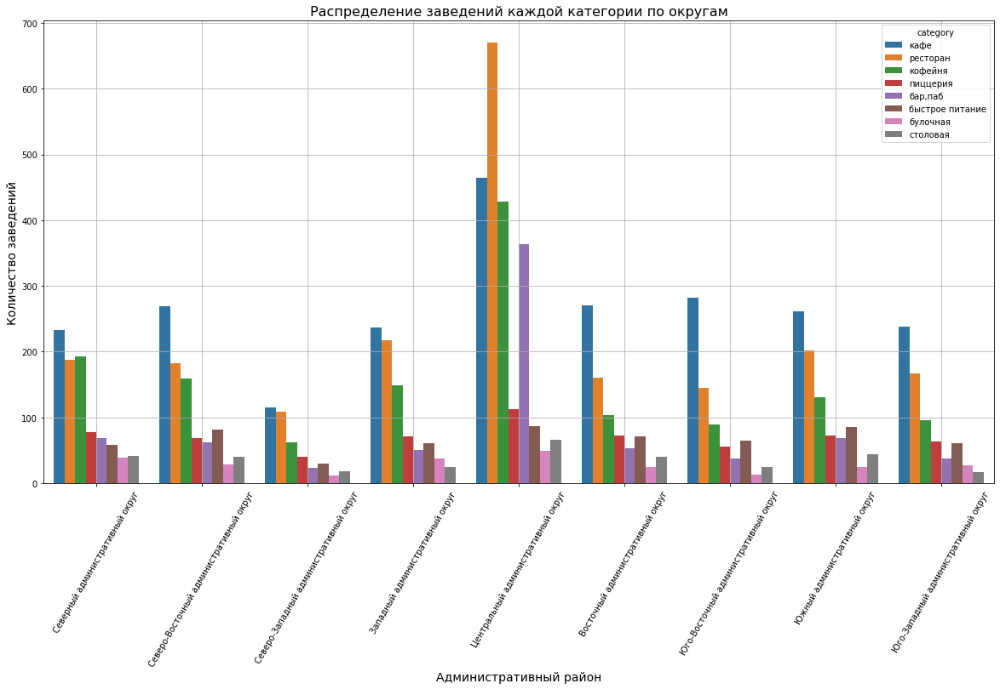

In [53]:
# количество заведений каждой категории по районам
district_category=data.groupby(['district', 'category']).agg({'name':'count'})\
    .sort_values(by='name', ascending=False).reset_index()
district_category.columns = ['district', 'category', 'count']
plt.figure(figsize=(20, 10))
sns.countplot(x='district', hue='category', data=data)
plt.grid()
plt.xticks(rotation=60)
plt.ylabel('Количество заведений', size=14)
plt.xlabel('Административный район', size=14)
plt.title('Распределение заведений каждой категории по округам', size=16)
plt.show()

***Итого:***

В датасете представлено 9 административных районов Москвы. С большим отрывом по числу заведений вырывается вперед Центральный АО - потчи 27% всего рынка заведений представлено там. Меньше всего заведений присутствует в Северо-Западном АО - 5%. В остальных регионах Москвы плюс минус одинаковое распеделение по числу заведений - 8-11%. Распределение по категориям числа заведений опять же показало, что Центральный АО самый востребованный по всем категориям, особенно рестораны, кафе, кофейни и бары/пабы. В других округах большую часть заведений составляют кафе.

### Визуализировать распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита;

In [54]:
# распределение средних рейтингов по категориям
category_rating = data.groupby('category').agg({'rating':'mean'})\
    .sort_values(by='rating', ascending=False).reset_index().round(1)
category_rating.columns = ['category', 'median_rating']
category_rating

,category,median_rating
0,"бар,паб",4.4
1,пиццерия,4.3
2,ресторан,4.3
3,кофейня,4.3
4,булочная,4.3
5,столовая,4.2
6,кафе,4.1
7,быстрое питание,4.0


In [55]:
fig = px.bar(category_rating, x='category', y='median_rating', text='median_rating', template='plotly_white',\
             title='Средний рейтинг по категориям')
fig.update_layout(xaxis_title='Категории заведений',
                  yaxis_title='Рейтинг')
fig.update_yaxes(range=[3.7, 4.5])
fig.show() 

***Итого:***

Средний рейтинг по всем категориям 4.0-4.4. Бары/пабы имеют самый высокий рейтинг, а вот у заведений быстрого питания и кафе самые низкие показатели рейтинга. Пиццерии, рестораны, кофейни и булочные имеют одинаковый рейтинг -4.3.

### Построить фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson;

In [56]:
district_rating = data.groupby('district').agg({'rating':'mean'})\
    .sort_values(by='rating', ascending=False).reset_index().round(1)
district_rating.columns = ['district', 'median_rating']
district_rating

,district,median_rating
0,Центральный административный округ,4.4
1,Северный административный округ,4.2
2,Северо-Западный административный округ,4.2
3,Южный административный округ,4.2
4,Западный административный округ,4.2
5,Восточный административный округ,4.2
6,Юго-Западный административный округ,4.2
7,Северо-Восточный административный округ,4.1
8,Юго-Восточный административный округ,4.1


In [57]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_rating,
    columns=['district', 'median_rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по округам',
).add_to(m)

# выводим карту
m

***Итого:***

Средний рейтинг по всем округам Москвы 4.1-4.4. Центральный АО имеет самый высокий рейтинг, а самый низкий рейтинг принадлежит Северо-Восточному и Юго-Восточному округам. Остальные АО Москвы имеют рейтинг 4.2.

### Отобразить все заведения датасета на карте с помощью кластеров средствами библиотеки folium;

In [58]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Найти топ-15 улиц по количеству заведений. Построить график распределения количества заведений и их категорий по этим улицам. Попробовать проиллюстрировать эту информацию одним графиком;

In [59]:
top_street = data['street'].value_counts().reset_index().head(15)# топ-15 улиц по количеству заведений
top_street.columns = ['street', 'count']
top_street

,street,count
0,проспект Мира,183
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,64


In [60]:
#воронка топ-15 сетевых заведений
fig = go.Figure([go.Funnel(x=top_street['count'], y=top_street['street'])])
fig.update_layout(title='Топ-15 улиц')          
fig.show()

In [61]:
#кол-во заведений по категориям на улицах Москвы 
street_count = data.groupby(['street', 'category'])['name'].count().reset_index()
street_count.columns = ['street', 'category', 'count']
street_count.sort_values('count', ascending=False)

,street,category,count
2860,проспект Мира,кафе,53
2863,проспект Мира,ресторан,45
1380,МКАД,кафе,45
2861,проспект Мира,кофейня,36
1989,Профсоюзная улица,кафе,35
...,...,...,...
1530,Мосфильмовская улица,столовая,1
1531,Моховая улица,"бар,паб",1
1533,Мукомольный проезд,булочная,1
1534,Мукомольный проезд,быстрое питание,1


In [62]:
#количество улиц по категориям
top_street_category = data.groupby('category').agg({'street':'nunique'})\
    .sort_values(by='street', ascending=False).reset_index()
top_street_category['rate'] = round(top_street_category['street']/sum(top_street_category['street'])*100, 1)
top_street_category

,category,street,rate
0,кафе,883,23.1
1,ресторан,738,19.3
2,кофейня,629,16.5
3,"бар,паб",430,11.3
4,пиццерия,390,10.2
5,быстрое питание,311,8.1
6,столовая,236,6.2
7,булочная,205,5.4


In [63]:
fig = px.bar(top_street_category, x='category', y='street', text='rate', template='plotly_white')
fig.update_layout(title='Распределение категорий по улицам',
                  xaxis_title='Категории заведений',
                  yaxis_title='Количество улиц')
fig.show()

In [64]:
# распределение количества заведений и их категорий по топ-15 улицам
top_street = street_count[street_count['street'].isin(top_street['street'])]
fig = px.bar(top_street.sort_values(by='category'),
             x='count',
             y='street',
             template='plotly_white',                   
             color='category'
            )
# оформляем график
fig.update_layout(title='Распределение заведений каждой категории по улицам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Названия улиц',
                  yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

In [65]:
print('Всего уникальных улиц в Москве:', data['street'].nunique())

Всего уникальных улиц в Москве: 1448


***Итого:***

Всего уникальных улиц в Москве: 1448. Больше всего заведений на проспекте Мира и далее на Профсоюзной улице, где чаще встречаются заведения категорий кафе, рестораны и кофейни. Меньше всего булочных. Из топ-15 улиц последнее место по числу заведений принадлежит Пятницкой улице, где преобладают рестораны и бары. А вот меньше всего на Пятницкой заведений быстрого питания. Также на графике хорошо прослеживается большое скопление кафе на МКАДе. 

### Найти улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях;

In [66]:
# улицы, на которых находится только один объект общепита
one_object=data['street'].value_counts().reset_index()
one_object.columns = ['street', 'count']
one_object=one_object[one_object['count'] == 1]
one_object

,street,count
989,Иваньковское шоссе,1
990,улица Поликарпова,1
991,улица Шухова,1
992,Лианозовский проезд,1
993,Сумской проезд,1
...,...,...
1443,парк Этнографическая деревня Бибирево,1
1444,Новая улица,1
1445,2-я Пугачёвская улица,1
1446,Новомосковская улица,1


In [67]:
# кол-во заведений по категориям с одним объектом общепита на улице
street_one = street_count[street_count['street'].isin(one_object['street'])]
street_one = street_one.groupby('category').agg({'street':'count'}).sort_values(by='street', ascending=False).reset_index()
street_one['rate'] = round(street_one['street']/sum(street_one['street'])*100, 1)
street_one

,category,street,rate
0,кафе,161,35.1
1,ресторан,93,20.3
2,кофейня,84,18.3
3,"бар,паб",39,8.5
4,столовая,36,7.8
5,быстрое питание,23,5.0
6,пиццерия,15,3.3
7,булочная,8,1.7


In [68]:
fig = px.bar(street_one, x='category', y='street', text='rate', template='plotly_white')
fig.update_layout(title='Распределение заведений с одним объектом общепита на улице по категориям',
                  xaxis_title='Категории заведений',
                  yaxis_title='Количество заведений')
fig.show()

In [69]:
#кол-во заведений по районам на улицах Москвы 
district_street_count = data.groupby(['street', 'district'])['name'].count().reset_index()
district_street_count.columns = ['street', 'district', 'count']
district_street_count.sort_values('count', ascending=False)
# кол-во улиц по районам с одним объектом общепита на улице
district_one = district_street_count[district_street_count['street'].isin(one_object['street'])]
district_one = district_one.groupby('district').agg({'street':'count'}).sort_values(by='street', ascending=False).reset_index()
district_one['rate'] = round(district_one['street']/sum(district_one['street'])*100, 1)
district_one

,district,street,rate
0,Центральный административный округ,145,31.6
1,Северо-Восточный административный округ,55,12.0
2,Восточный административный округ,52,11.3
3,Северный административный округ,52,11.3
4,Южный административный округ,43,9.4
5,Юго-Восточный административный округ,39,8.5
6,Западный административный округ,36,7.8
7,Северо-Западный административный округ,19,4.1
8,Юго-Западный административный округ,18,3.9


In [70]:
data.query('district=="Центральный административный округ"')['street'].nunique()

457

In [71]:
fig = px.bar(district_one, x='district', y='street', text='rate', template='plotly_white')
fig.update_layout(title='Количество улиц с одним объектом общепита на улице по округам',
                  xaxis_title='Административный район',
                  yaxis_title='Количество заведений')
fig.show()

***Итого:***

459 улиц из 1448 имеют только 1 заведение, где преобладают категории кафе, рестораны и кофейни. Меньше всего на этих улицах булочных. Почти 32% таких улиц находится в Ценральном АО.

### Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитать медиану этого столбца для каждого района. Использовать это значение в качестве ценового индикатора района. Построить фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализировать цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях;

In [72]:
median_data=data.query('middle_avg_bill != 0')#датасет без значений заглушек
median_bill = median_data.groupby('district').agg({'middle_avg_bill':'median'})\
    .sort_values(by='middle_avg_bill', ascending=False).reset_index()
median_bill

,district,middle_avg_bill
0,Западный административный округ,1000
1,Центральный административный округ,1000
2,Северо-Западный административный округ,700
3,Северный административный округ,650
4,Юго-Западный административный округ,600
5,Восточный административный округ,575
6,Северо-Восточный административный округ,500
7,Южный административный округ,500
8,Юго-Восточный административный округ,450


In [73]:
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m2)

# выводим карту
m2


***Итого:***

Самые большие показатели среднего чека в Центральном и Западном округах Москвы - в среднем около 1000 рублей. Самый низкий средний чек принадлежит Юго-Восточному АО - в среднем 450 рублей. Остальные административные округа Москвы в среднем имеют средний чек около 500-700 руб. На карте хорошо прослеживается связь - чем дальше от Западного и Центрального АО, тем меньше средний чек в заведении. Исключение - Восточный АО, где цены, как в близлежащих округах от ЦАО и ЗАО, то есть чуть ниже - около 600 рублей.  

### Необязательное задание: проиллюстрировать другие взаимосвязи, которые вы нашли в данных. Например, по желанию исследовать часы работы заведений и их зависимость от расположения и категории заведения. Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений;

In [74]:
time_data=data['is_24_7'].value_counts().reset_index()# датасет только с сетевыми заведениями 
time_data.columns = ['is_24_7', 'count']
time_data['rate'] = round(time_data['count']/sum(time_data['count'])*100, 0)
time_data

,is_24_7,count,rate
0,False,7659,91.0
1,True,729,9.0


Заведений, которые работают ежедневно и круглосуточно крайне мало - лишь 9% от всего рынка.

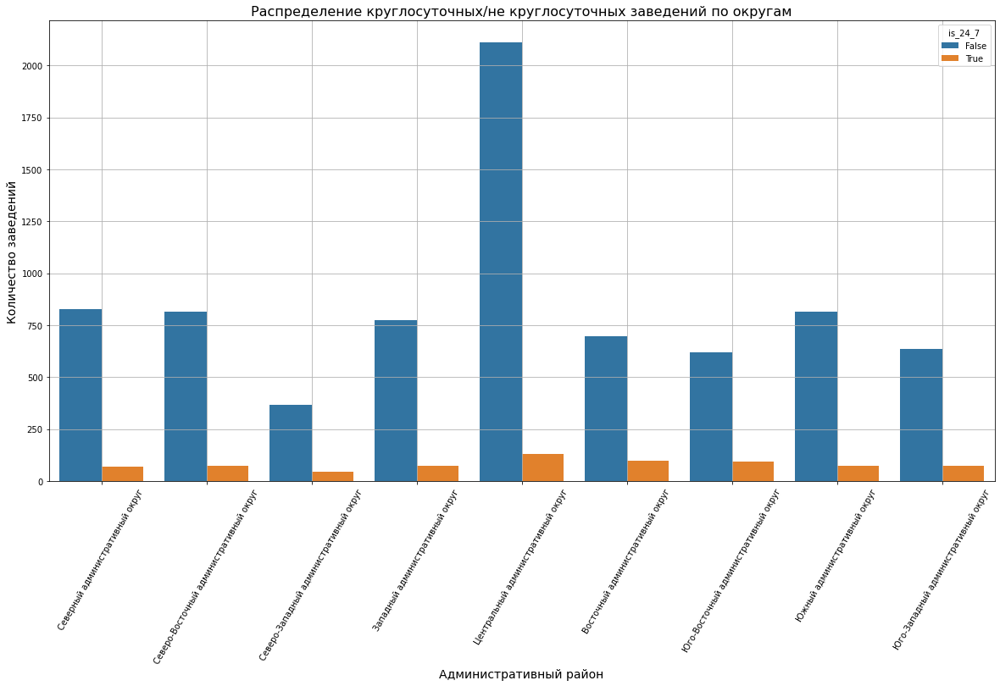

In [75]:
time_district=data.groupby(['is_24_7', 'district'])['name'].count().reset_index()
time_district.columns = ['is_24_7', 'district', 'count']
plt.figure(figsize=(20, 10))
sns.countplot(x='district', hue='is_24_7', data=data)
plt.grid()
plt.xticks(rotation=60)
plt.ylabel('Количество заведений', size=14)
plt.xlabel('Административный район', size=14)
plt.title('Распределение круглосуточных/не круглосуточных заведений по округам', size=16)
plt.show()

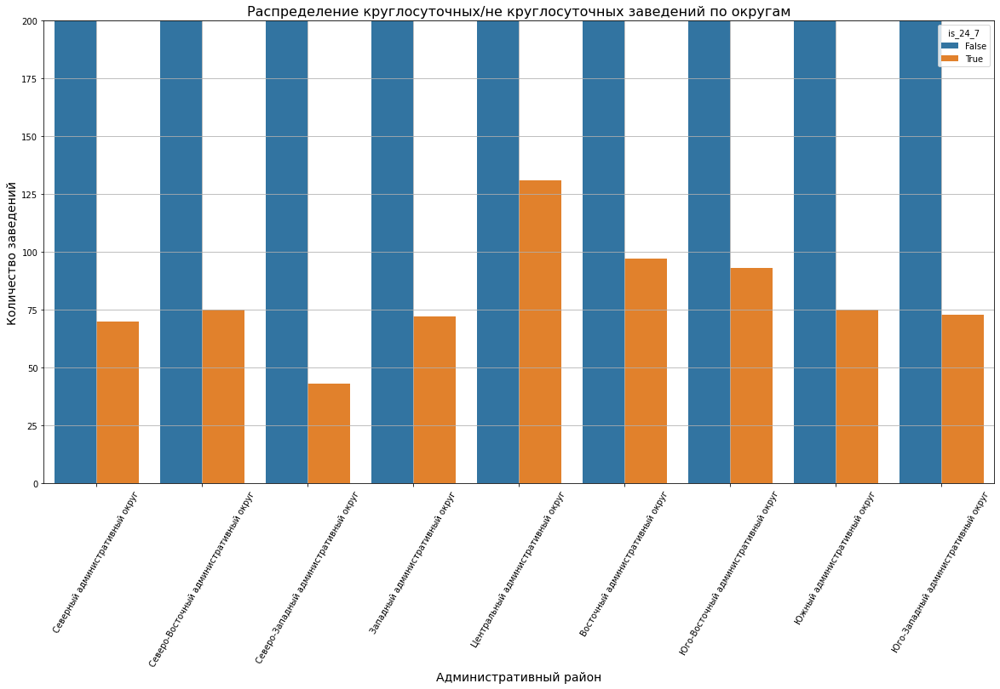

In [76]:
plt.figure(figsize=(20, 10))
sns.countplot(x='district', hue='is_24_7', data=data)
plt.grid()
plt.xticks(rotation=60)
plt.ylabel('Количество заведений', size=14)
plt.xlabel('Административный район', size=14)
plt.title('Распределение круглосуточных/не круглосуточных заведений по округам', size=16)
plt.ylim(0,200)
plt.show()

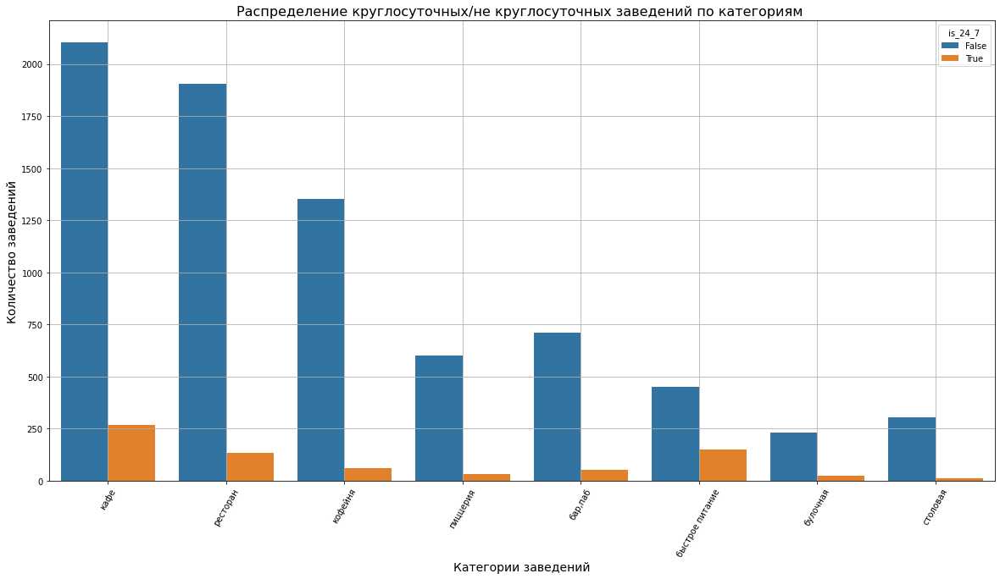

In [77]:
time_category=data.groupby(['is_24_7', 'category'])['name'].count().reset_index()
time_category.columns = ['is_24_7', 'category', 'count']
plt.figure(figsize=(20, 10))
sns.countplot(x='category', hue='is_24_7', data=data)
plt.grid()
plt.xticks(rotation=60)
plt.ylabel('Количество заведений', size=14)
plt.xlabel('Категории заведений', size=14)
plt.title('Распределение круглосуточных/не круглосуточных заведений по категориям ', size=16)
plt.show()

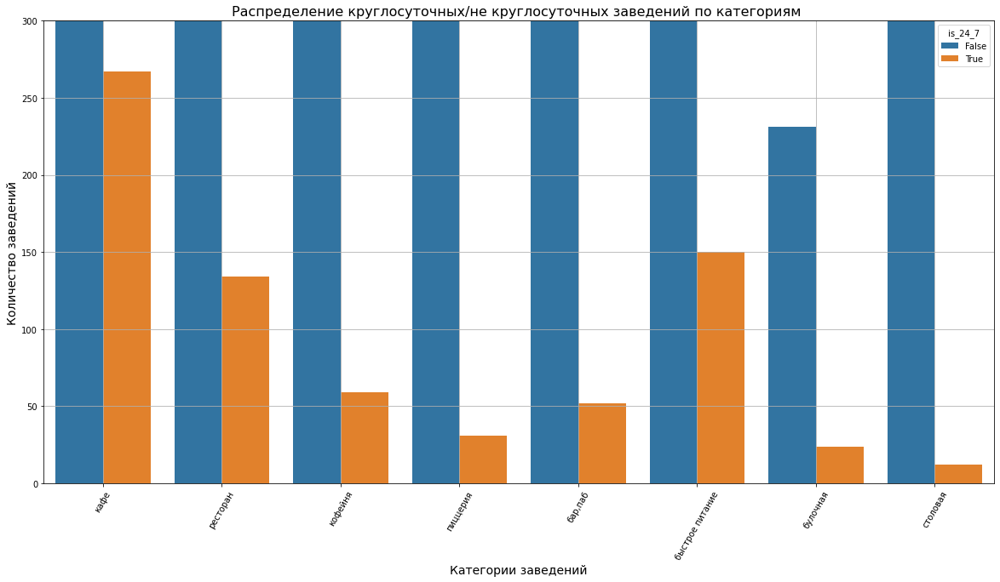

In [78]:
plt.figure(figsize=(20, 10))
sns.countplot(x='category', hue='is_24_7', data=data)
plt.grid()
plt.xticks(rotation=60)
plt.ylabel('Количество заведений', size=14)
plt.xlabel('Категории заведений', size=14)
plt.title('Распределение круглосуточных/не круглосуточных заведений по категориям ', size=16)
plt.ylim(0,300)
plt.show()

In [79]:
data['rating'].unique()#уникальные оценки

array([5. , 4.5, 4.6, 4.4, 4.7, 4.8, 4.3, 4.9, 4.2, 4.1, 4. , 3.8, 3.9,
       3.7, 3.6, 2.8, 2.7, 3.1, 1.5, 2. , 1.4, 3.3, 3.5, 3.2, 2.9, 3. ,
       3.4, 2.3, 2.2, 2.5, 2.6, 1.7, 1. , 1.1, 2.4, 1.3, 1.2, 2.1, 1.8,
       1.9, 1.6])

In [80]:
def rating_type (row): # создание функции с условиями категоризации
    if row['rating'] < 2:
        return 'ужасный'
    elif 2 <= row['rating'] < 3:
         return 'ничего хорошего'
    elif 3 <= row['rating'] < 4:
         return 'плохо'
    elif 4 <= row['rating'] < 4.5:
         return 'хорошо'    
    else:
        return 'отлично'
data['rating_type'] = data.apply(rating_type, axis=1) #добавлен столбец 'rating_type' c категоризацией рейтинга

In [81]:
rating_type_count=data['rating_type'].value_counts().reset_index()
rating_type_count.columns = ['rating_type', 'count']
rating_type_count['rate'] = round(rating_type_count['count']/sum(rating_type_count['count'])*100, 0)
rating_type_count

,rating_type,count,rate
0,хорошо,5177,62.0
1,отлично,2045,24.0
2,плохо,956,11.0
3,ничего хорошего,147,2.0
4,ужасный,63,1.0


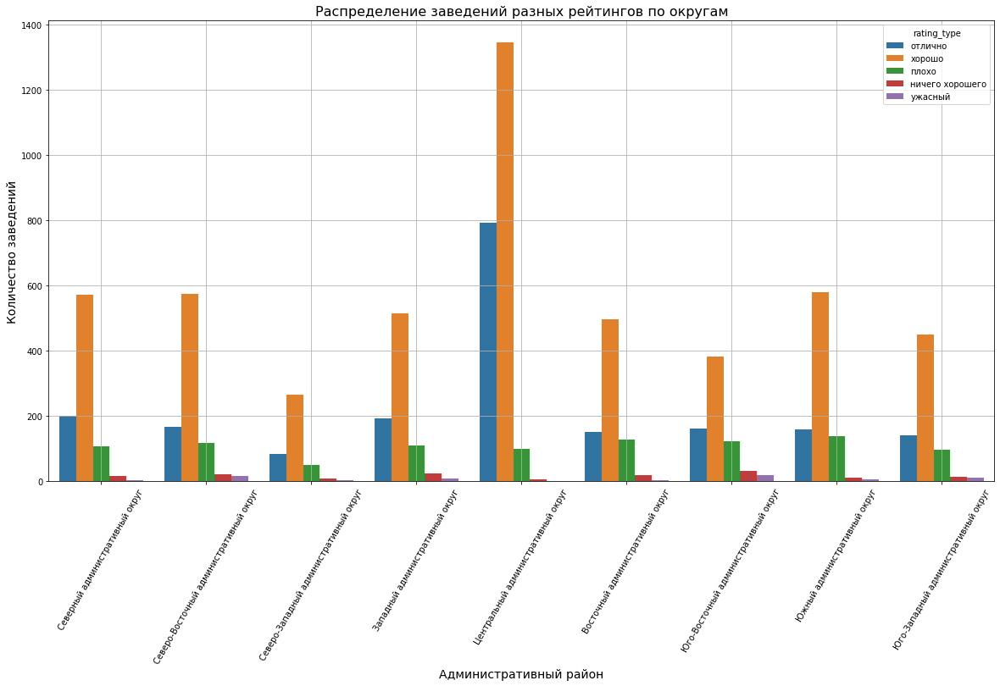

In [82]:
#распределение заведений разных рейтингов по округам
rating_district=data.groupby(['rating_type', 'district'])['name'].count().reset_index()
rating_district.columns = ['rating_type', 'district', 'count']
plt.figure(figsize=(20, 10))
sns.countplot(x='district', hue='rating_type', data=data)
plt.grid()
plt.xticks(rotation=60)
plt.ylabel('Количество заведений', size=14)
plt.xlabel('Административный район', size=14)
plt.title('Распределение заведений разных рейтингов по округам', size=16)
plt.show()

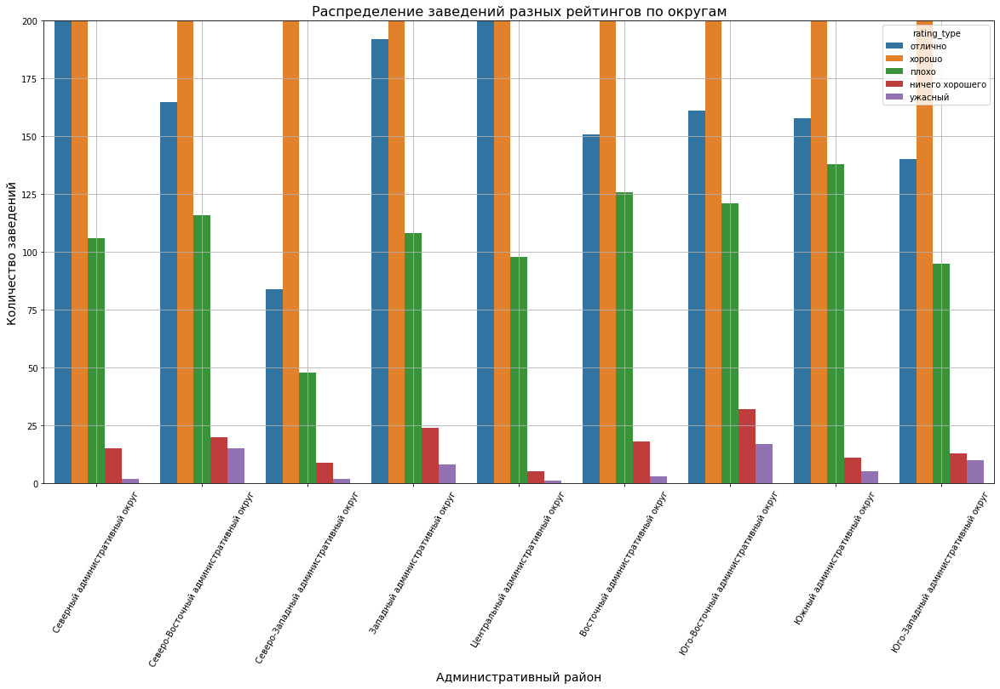

In [83]:
plt.figure(figsize=(20, 10))
sns.countplot(x='district', hue='rating_type', data=data)
plt.grid()
plt.xticks(rotation=60)
plt.ylabel('Количество заведений', size=14)
plt.xlabel('Административный район', size=14)
plt.title('Распределение заведений разных рейтингов по округам', size=16)
plt.ylim(0,200)
plt.show()

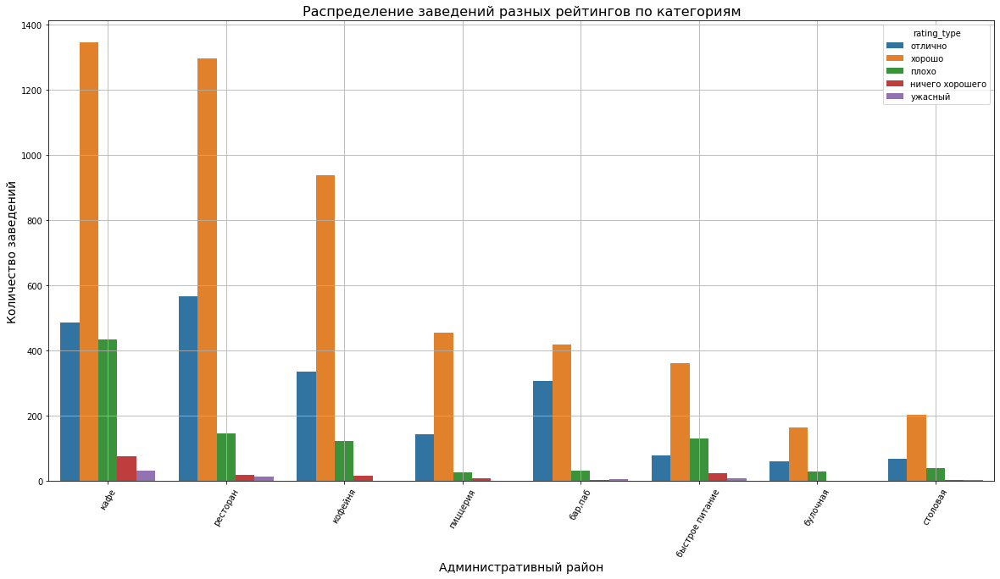

In [84]:
#распределение заведений разных рейтингов по категориям
rating_category=data.groupby(['rating_type', 'category'])['name'].count().reset_index()
rating_category.columns = ['rating_type', 'category', 'count']
plt.figure(figsize=(20, 10))
sns.countplot(x='category', hue='rating_type', data=data)
plt.grid()
plt.xticks(rotation=60)
plt.ylabel('Количество заведений', size=14)
plt.xlabel('Административный район', size=14)
plt.title('Распределение заведений разных рейтингов по категориям', size=16)
plt.show()

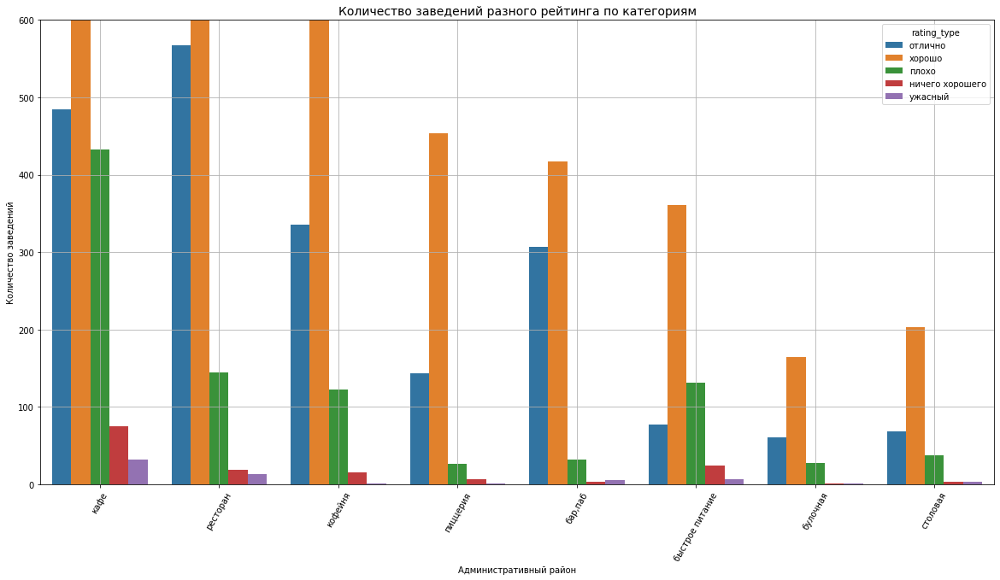

In [85]:
rating_category=data.groupby(['rating_type', 'category'])['name'].count().reset_index()
rating_category.columns = ['rating_type', 'category', 'count']
plt.figure(figsize=(20, 10))
sns.countplot(x='category', hue='rating_type', data=data)
plt.grid()
plt.xticks(rotation=60)
plt.ylabel('Количество заведений', size=10)
plt.xlabel('Административный район', size=10)
plt.title('Количество заведений разного рейтинга по категориям', size=14)
plt.ylim(0,600)
plt.show()

***Итого:***

Круглосуточных заведений лишь 9%.\
И круглосуточных и не круглосуточных больше всего в Центральном и меньше всего в Северо-Западном округе. Остальные не круглосуточные распределены между округами практически равномерно - в каджом округе примерно от 600 до 800 заведений. А круглосуточные заведения имеют еще 2 лидера помимо Ценрального, следом идут Восточный и Юго-Восточный округа - примерно по 95 заведений в каждом. В остальных округах примерно по 70 круглосуточных заведений.\
Категории кафе, ресторан и кофейня лидирут у не круглосутоных заведений и меньше всего у них булочных.
У круглосутоных заведений лидируют категории: кафе, быстрое питание и ресторан, а меньше всего столовых.\
В основном рейтинг заведений составляет 4-4.4 - 62% "хороших" оценок. 24% составляют "отличные" оценки - от 4.5-5. Эти оценки лидируют в центральном округе. В Юго-Восточно округе оценок типо "ничего хорошего" и "ужасно" гораздо больше, чем в других округах. Оценки "плохо" распределены плюс минус равномерно.\
Оценок типо "плохо", "ничего хорошего" и "ужасно" гораздо больше в заведениях категории кафе, причем оценок "плохо" почти столько же, сколько оценок типа "отлично". Отличные и хорошие оценки в основной массе у категорий ресторан, кофейня и бар/паб.

##### ***Вывод:***

Было установлено следующее:
- больше всего с Москве кафе(28%), ресторанов(24%) и кофеен(17%), которые совместо занимают почти 70% рынка;
- заведения разных категорий имеют кол-во посадочных мест от 40 до 150, в среднем 60-80 мест. Больше всего посадочных мест зафиксировано у ресторанов, баров/пабов и кофеен, а меньше всего у булочных;
- сетевых заведений 38%, а несетевых 62%. У всех распространенные категории это кафе и рестораны;
- чаще сетевые это булочные, пиццерии и кофейни. Категории бар/паб и столовая чаще несетевые;
- уникальных сетей 746. Рекордсмен по сетевым заведениям - сеть "Шоколадница". Среди топ-15 сетей преобладают категории: кофейня, пиццерия, ресторан и кафе. Одна сеть может иметь разные категории;
- в Центральном округе сосередоточена большая часть всех заведений города - 27%, а меньше всего в Северо-Западном округе - лишь 5%. В остальный районах примерно одинаковое распределение заведений 8-11%;
- по всем категориям Центральный округ самый востребованный, особенно преобладают рестораны, кафе, кофейни и бары/пабы. В других регионах в основном преобладают кафе;
- средний рейтинг по всем категориям хороший, а именно, 4-4.4. Самый высокий средний рейтинг принадлежит категории бары/пабы, далее оценку 4.3 имеют пиццерии, рестораны, кофейни и булочные. Рейтинг ниже имеют столовые, кафе и заведения быстрого питания;
- средний рейтинг по районам - 4.1-4.4. Самый высокий средний рейтинг в Центральном районе, самый низкий в Северо-Восточном и Юго-Восточном округах. Остальные обладают рейтингом 4.2;
- всего уникальных улиц 1448. Больше всего заведений на проспекте Мира с преобладанием категорий кафе, рестораны и кофейни, а меньше всего категории булочных. Из топ-15 улиц, на Пятницкой насчитывается меньше всего заведений с преобладанием категорий ресторанов и баров, меньше всего там заведений быстрого питания. На МКАДе преобладают кафе;
- улиц с 1 объектом общепита всего 459, где преобладают категории кафе, рестораны и кофейни. Самое большое количество улиц с единственным заведением находится в ЦАО, следовательно этот район перспективен для открытия заведений;
- самый большой показатель среднего чека в Центральном и Западном округах - 1000 руб, а самый низкий в Юго-Восточном округе - 450 руб. В остальных округах в среднем 500-700 руб;
- круглосуточных заведений лишь 9%. Круглосуточных и не круглосуточных больше всего в Центральном и меньше всего в Северо-Западном округе. Остальные не круглосуточные распределены между округами практически равномерно - в каджом округе примерно от 600 до 800 заведений. А круглосуточные заведения имеют еще 2 лидера помимо Ценрального, следом идут Восточный и Юго-Восточный округа - примерно по 95 заведений в каждом. В остальных округах примерно по 70 круглосуточных заведений.
- категории кафе, ресторан и кофейня лидирут у не круглосутоных заведений и меньше всего у них булочных. У круглосутоных заведений лидируют категории: кафе, быстрое питание и ресторан, а меньше всего столовых.
- В основном рейтинг заведений составляет 4-4.4 - 62% "хороших" оценок. 24% составляют "отличные" оценки - от 4.5-5. Эти оценки лидируют в Центральном округе. В Юго-Восточно округе оценок типо "ничего хорошего" и "ужасно" гораздо больше, чем в других округах. Оценки "плохо" распределены плюс минус равномерно. Оценок типо "плохо", "ничего хорошего" и "ужасно" гораздо больше в заведениях категории кафе, причем оценок "плохо" почти столько же, сколько оценок типа "отлично". Отличные и хорошие оценки в основной массе у категорий ресторан, кофейня и бар/паб.

Исходя из выше изложенного, рекомендуется:
- открываться в Центральном округе, так как самые высокие показатели среднего чека и рейтинга, этот район популярен в любое время суток. Еще 32% улиц лишь 1 заведением, следовательно есть места для открытия конкурентноспособной точки. Рекомендуется открывать круглосуточные кофейни и бары (большое кол-во посадочных мест, хорошие рейтинги), также сетевые кафе и пиццерии. Рестораны тоже можно, если не бояться конкуренции;
- можно открыться в Северо-Западном округе, так как там меньше всего заведений по всем категориям и достаточно хороший и средний чек и рейтинг;
- в Западном округе отличный средний чек, как и в центре, хороший рейтинг. Рекомендуется рассмотреть самые востребованные категории - кафе, рестораны и кофейни;
- Юго-Восточный не рекомендуется так как там низкий средний чек и большое кол-во плохих оценок;
- Кафе и рестораны – самые массовые категории по всем регионам, кафе обычно имеют слабый рейтинг. Но можно открыть в еще малоразвитом регионе – Северо-Западном округе;
- булочные – мало посадочных мест, лучше сетевые (узнаваемые), рейтинг хороший. Лучше открываться в спальный районах, где их меньше всего, например Северо-Западном;
- столовые – чаще не сетевые, открывать лучше рядом с заводами или большими центральными офисами, и там, где их меньше всего, например, СЗАО и ЮЗАО;
- быстрое питание имеет самый низкий рейтинг – не самое перспективное направление, однако если открывать, то лучше сетевое (узнаваемое) и центре;

## Шаг 4. Детализируем исследование: открытие кофейни

Мечта заказчика — открыть крутую и доступную кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. 
- Сколько всего кофеен в датасете? 
- В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни? Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Построить визуализации. Попробовать дать рекомендацию для открытия нового заведения. Это творческое задание: здесь нет правильного или неправильного ответа, но ваше решение должно быть чем-то обосновано. Объяснить свою рекомендацию можно текстом с описанием или маркерами на географической карте.

In [86]:
coffee_shop=data[data['category']== 'кофейня']
print('Всего кофеен в датасете:', len(coffee_shop))

Всего кофеен в датасете: 1411


In [87]:
# количество кофеен по районам
coffee_shop_count=coffee_shop.groupby('district').agg({'name':'count'}).reset_index()
coffee_shop_count.columns = ['district', 'count']
coffee_shop_count['rate'] = round(coffee_shop_count['count']/sum(coffee_shop_count['count'])*100, 1)
coffee_shop_count.sort_values(by='count', ascending=False)

,district,count,rate
5,Центральный административный округ,428,30.3
2,Северный административный округ,193,13.7
3,Северо-Восточный административный округ,159,11.3
1,Западный административный округ,149,10.6
8,Южный административный округ,131,9.3
0,Восточный административный округ,104,7.4
7,Юго-Западный административный округ,96,6.8
6,Юго-Восточный административный округ,89,6.3
4,Северо-Западный административный округ,62,4.4


In [88]:
# расположения кофеен
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m3)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_shop.apply(create_clusters, axis=1)

# выводим карту
m3

Расположение кофеен в основном в бизес центрах, ТЦ, в местах большой проходимости людей, жилых комлексах вдоль улиц.

In [89]:
all_day=coffee_shop.query('hours == "ежедневно, круглосуточно"')
print('Уникальных ежедневных круглосуточных кофеен:', all_day['name'].nunique())
print('Всего ежедневных круглосуточных кофеен:',all_day['name'].count())
print('Доля ежедневных круглосуточных кофеен:', round(len(all_day)/len(coffee_shop)*100,1))

Уникальных ежедневных круглосуточных кофеен: 22
Всего ежедневных круглосуточных кофеен: 59
Доля ежедневных круглосуточных кофеен: 4.2


In [90]:
#кол-во ежедневных круглосуточных кофеен по округам
all_day_count=coffee_shop.query('hours == "ежедневно, круглосуточно"')\
                   .groupby('district').agg({'name':'count'}).reset_index()
all_day_count.columns = ['district', 'count']
#распределение ежедневных круглосуточных кофеен по округам
all_day_count['rate'] = round(all_day_count['count']/sum(all_day_count['count'])*100, 1)
all_day_count.sort_values(by='count', ascending=False)

,district,count,rate
5,Центральный административный округ,26,44.1
1,Западный административный округ,9,15.3
7,Юго-Западный административный округ,7,11.9
0,Восточный административный округ,5,8.5
2,Северный административный округ,5,8.5
3,Северо-Восточный административный округ,3,5.1
4,Северо-Западный административный округ,2,3.4
6,Юго-Восточный административный округ,1,1.7
8,Южный административный округ,1,1.7


Ежедневные круглосуточные кофейни чаще (в 44% случаев) располагаются в центре города. Далее 15% кофеен в Западном АО и 12% в Юго-Западном АО.

In [91]:
coffee_shop_count=coffee_shop_count.sort_values(by='district', ascending=False)
all_day_count=all_day_count.sort_values(by='district', ascending=False)
#доля ежедневных круглосуточных кофеен по округам от общего чила кофеен по округам
all_day_count['rate_all'] = round(all_day_count['count']/coffee_shop_count['count']*100, 1)
#конкурентость
all_day_count['competitor'] = round(all_day_count['rate_all']/coffee_shop_count['rate']*100, 1)
all_day_count.sort_values(by='competitor')

,district,count,rate,rate_all,competitor
8,Южный административный округ,1,1.7,0.8,8.6
3,Северо-Восточный административный округ,3,5.1,1.9,16.8
6,Юго-Восточный административный округ,1,1.7,1.1,17.5
2,Северный административный округ,5,8.5,2.6,19.0
5,Центральный административный округ,26,44.1,6.1,20.1
1,Западный административный округ,9,15.3,6.0,56.6
0,Восточный административный округ,5,8.5,4.8,64.9
4,Северо-Западный административный округ,2,3.4,3.2,72.7
7,Юго-Западный административный округ,7,11.9,7.3,107.4


In [92]:
#рейтинг кофеен по округам
rating_all_day= coffee_shop.groupby('district').agg({'rating':'mean'})\
    .sort_values(by='rating', ascending=False).reset_index().round(1)
rating_all_day.columns = ['district', 'rating']
rating_all_day

,district,rating
0,Центральный административный округ,4.3
1,Северо-Западный административный округ,4.3
2,Северный административный округ,4.3
3,Восточный административный округ,4.3
4,Юго-Западный административный округ,4.3
5,Южный административный округ,4.2
6,Юго-Восточный административный округ,4.2
7,Северо-Восточный административный округ,4.2
8,Западный административный округ,4.2


Рейтинг кофеен по округам в среднем 4.3, лишь в Западном округе чуть ниже - 4.2.

In [93]:
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_all_day,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m5)

# выводим карту
m5

In [94]:
good_all_day=coffee_shop.query('middle_coffee_cup != 0')# очищенный датасет

In [95]:
good_all_day['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Есть небольшие выбросы, посмотрим на диаграмму размаха

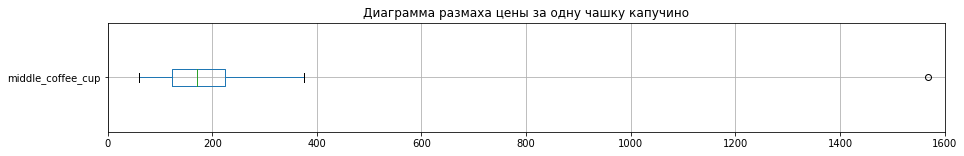

In [96]:
fig, ax = plt.subplots(figsize = (15,2))
ax = good_all_day[['middle_coffee_cup']].boxplot(vert = False, ax =ax)
ax.set_title('Диаграмма размаха цены за одну чашку капучино')
ax.set_xlim(0, 1600);

In [97]:
good_all_day=good_all_day.query('middle_coffee_cup != 1568')# очищенный датасет
good_all_day['middle_coffee_cup'].describe()

count    520.000000
mean     172.376923
std       65.767854
min       60.000000
25%      124.000000
50%      169.500000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

In [98]:
#средняя цена за одну чашку капучино по округам
median_all_day=good_all_day.groupby('district').agg({'middle_coffee_cup':'median'})\
    .sort_values(by='middle_coffee_cup', ascending=False).reset_index().round(1)
median_all_day

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


Цена в среднем за одну чашку капучино варируется от 135-198. Самая высокая стоимость в Юго-Западном, Центральном и Западном  округах(189-198 руб). Самая низкая стоимость в Восточном округе - 135 руб.

In [99]:
m6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_all_day,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний цена чашки кофе по районам',
).add_to(m6)

# выводим карту
m6

***Итого:***
- Кофеен всего 1411, большая часть из которых расположена в Центральном округе - 30%. В 2-3 раза меньше кофеен находится в Северном, Северо-Восточном и Западном округах (11-14%). Самый малый процент кофеен в Северо-Западном АО - 4%.
- Доля ежедневных круглосуточных кофеен составляет только 4.2%, из которых опять же больше всего (44%) представлено в Центральном округе. Далее в Западном 15% и Юго-Западном 12%. В остальных округах от 2 до 9%.
- Рейтинг кофеен по округам в среднем 4.3, лишь в Западном округе чуть ниже - 4.2.
- Цена в среднем за одну чашку капучино варируется от 135-198. Самая высокая стоимость в Юго-Западном, Центральном и Западном  округах(189-198 руб). Самая низкая стоимость в Восточном округе - 135 руб.
- Расположение кофеен в основном в бизес центрах, ТЦ, в местах большой проходимости людей, в жилых комлексах вдоль улиц.
- При открытии кофейни стоимость чашки капучино будет зависить от выбора округа и его среднего прайса за чашку капучино. Рекомендуется для начала выставить прайс чуть ниже среднего, чтобы привлечь покупателей. Открывать кофейню необходимо в легкодоступном месте с большим потоком людей.

В Центральном АО сосредоточена бОльшая часть кофеен (30%) с высоким рейтингом 4.3, из них круглосуточных кофеен только (6%). Цена в среднем за чашку капучино в этом округе 190 рублей. Данный район можно рассмотреть для открытия кофейни, причем лучше круглосуточную.\
В Юго-Западном АО всего 7% кофеен с высоким рейтингом 4.3, из них 4% круглосуточные, однако цена за чашку капучино самая высокая. Возможно такая цена обоснована тем, что больше половины кофеен в этом районе круглосуточные. Похожая ситуация в Западном АО, где доля круглосуточных кафейн 5% из 11% кофеен в этом округе. Данные районы тоже можно рассмотреть для открытия кофейни, но тут большая конкурентность по круглосуточным кофейням.


## Шаг 5. Подготовка презентации

Презентация: <https://disk.yandex.ru/i/W-_ieD3RKSSnRw>

***Общий вывод:***

В целях открытия бизнес-заведения в сфере общественного питания были проанализированы данные рынка с заведениями города Москвы и установлены его особенности для понимания, что это будет за место и какими будут расположение, меню и цены.

На этапе предобработке данных было установлено 23% пропусков во всем датасете, которые были заполнены значениями заглушками, так как эти данные получить или рассчитать нельзя. Явные дубликаты отсутствовали, однако были удалены неявные дубликаты. Добавлены столбцы с названиями улиц и режимом работы заведения. Поменяли тип данных некоторых столбцов.

Датасет составлен на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года и содержит информацию о 8406 заведениях, из которых 5512 уникальных заведений в 9 округах Москвы с категориями : кафе, ресторан, кофейня, бар/паб, быстрое питание, столовая, булочная и пиццерия.

В ходе анализа установили важные инсайты:
- многочисленные сети имеют не самые популярные категории среди сетевого рынка заведений. Например, пиццерия "додо" многочисленная сеть, но на рынке сетевых заведений эта категория далеко не самая популярная.
- самые многочисленные по заведениям улицы не в центре
- одному заведению может принадлежать несколько категорий
- бары имеют самый высокий рейтинг и больше всего их в центре города, чаще несетевые 
- категории кафе, рестораны и кофейни - занимают 70% рынка в Москве, эти категории преобладают как в сетевом, так в несетевом рынке, больше всего данные категории представлены в центре города, эти категории популярны и на улицах с 1 объектом общепита, так и на самой загруженной улице - пр. Мира, эти категории имеют высокий рейтинг, кроме категории кафе
- в Центральном округе сосередоточена большая часть всех заведений города, причем преобладет по всем категориям, имеет самые высокие показатели среднего рейтинга и среднего чека, также тут самое большое кол-во улиц с всего 1 заведением
- сетевых заведений 38%, а несетевых 62%
- чаще являются сетевыми, чем не сетевыми - булочные, пиццерии и кофейни
- самый большой показатель среднего чека в Центральном и Западном округах, далее в Восточном.
- средний рейтинг по всем категориям - 4-4.4, где максимальный у баров, средний рейтинг по районам - 4.1-4.4, где максимальный в Центральном.
- круглосуточные заведения преобладают в Центральном, Восточном и Юго-Восточном округах с категориями кафе, быстрое питание и ресторан
- кафе имеют низкий средний рейтинг и представлены в большей массе на МКАДе

Исходя из выше изложенного, рекомендуется:
- открываться в Центральном округе, так как там самые высокие показатели среднего чека и рейтинга, этот район популярен в любое время суток. А так же 32% улиц лишь с 1 заведением, следовательно есть места для открытия конкурентноспособной точки. Рекомендуется открывать круглосуточные кофейни и бары (большое кол-во посадочных мест, хорошие рейтинги), также сетевые кафе и пиццерии. Рестораны тоже можно, если не бояться конкуренции;
- можно открыться в Северо-Западном округе, так как там меньше всего заведений по всем категориям и достаточно хороший и средний чек и рейтинг;
- в Западном округе отличный средний чек как и в центре, хороший рейтинг. Рекомендуется рассмотреть самые востребованные категории - кафе, рестораны и кофейни;
- Юго-Восточный не рекомендуется так как там низкий средний чек и большое кол-во плохих оценок;

Кофейня такая же крутая и доступная, как «Central Perk», должная быть круглосуточной, чтобы друзья могли собираться там в любое удобное для них время. А также, в этом случае, не нужно думать о часах работы заведения. Открывать такую кофейню лучше там, где доля круглосуточных кофеен по району меньше, но и цена не маленькая. Под эти критерии самый подходящий округ - Центральный. Подойдут также округа Юго-Западный и Западный, однако конкурентность круглосуточных кофеен больше.\
Рекомендуется: 
- открыть кофейню в легкодоступном месте с большим потоком людей. 
- при открытии кофейни стоимость чашки капучино будет зависить от выбора округа и его среднего прайса за чашку капучино. Также рекомендуется для начала выставить прайс чуть ниже среднего, чтобы привлечь покупателей. 
- сделать анализ посещаемости людей в будни и выходные, ночью и днем, с целью определения объема рынка потребителей.

Центральный район самый оживленный, даже в ночное время. Несмотря на самое большое число как кофеен, так и круглосуточных кофеен в этом районе, все равно круглосуточных кофеен недостаточно. Вот в Юго-Западном округе большая конкуретность, но и цена за чашку капучино самая высокая, поэтому можно рассмотреть этот район, так как наши заказички не боятся конкуренции. В Западном округе и конкуретность и рейтинг чуть ниже, чем в Юго-Западном, но цена как в Центральном районе, поэтому можно рассмотреть этот вариант - с прайсом чуть ниже и добиться хорошего рейтинга.